# **Introduction**
**Computer Vision**

The goal of this project is to explore the basics of Image processing in Python and understand the functioning of the Convolutional Neural networks. Computer vision is a field of artificial intelligence that trains computers to interpret and understand the visual world. Using digital images from cameras and videos and deep learning models, machines can accurately identify and classify objects and then react to what they “see.” One of the application is to classify handwritten documents. We use CNN and keras Sequence for this purpose.

## **PART 1**
**Answer 1 and 2 Load the project and run all**

#**Introduction to Image Processing in Python**
An NCSU Libraries Workshop

Speaker: Nian Xiong

>This workshop provides an introduction to basic image processing techniques using the OpenCV computer vision library and some standard data analysis libraries in Python. Knowledge of image processing and Python programming is not required for this workshop, but will help.

*The source of this notebook is located at https://github.com/xn2333/OpenCV/blob/master/Seminar_Image_Processing_in_Python.ipynb*

*Useful intro about [Colab](https://colab.research.google.com/notebooks/welcome.ipynb)*

*Useful intro about [OpenCV](https://opencv.org/)*








##Step1: Load the Dependencies

> This section loads some required libraries used in this notebook: **numpy**, **pandas**, **cv2**, **skimage**, **PIL**, **matplotlib**

In [ ]:
import numpy as np
import pandas as pd
import cv2 as cv 
from google.colab.patches import cv2_imshow # for image display
from skimage import io
from PIL import Image 
import matplotlib.pylab as plt

##Step2: Read Image from Urls

> In this step we will read images from urls, and display them using openCV, please note the difference when reading image in RGB and BGR format. The default input color channels are in BGR format for openCV.

RGB?

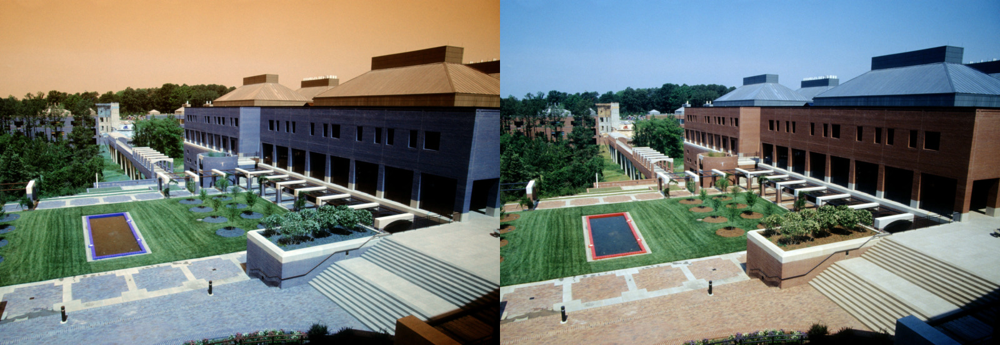

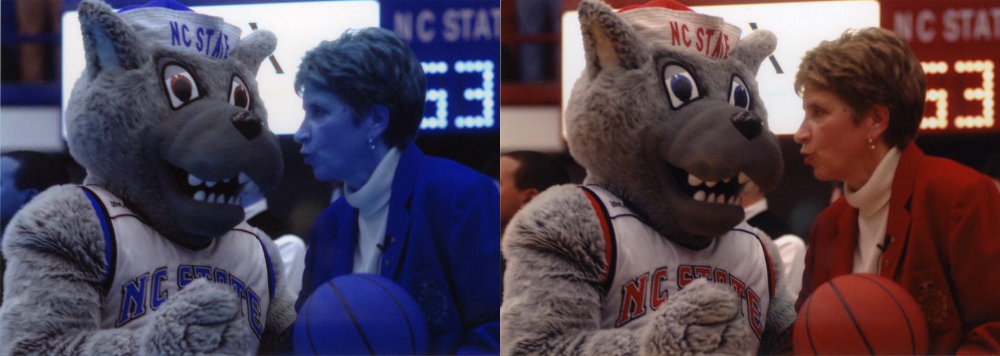

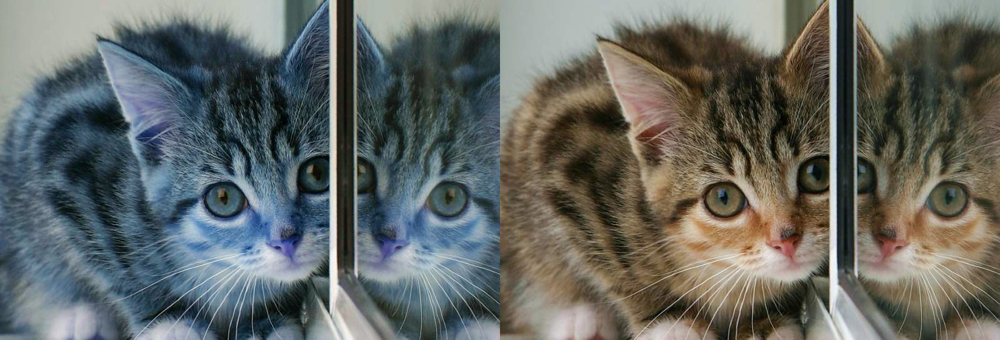

In [ ]:
# Create a list to store the urls of the images
urls = ["https://iiif.lib.ncsu.edu/iiif/0052574/full/800,/0/default.jpg",
       "https://iiif.lib.ncsu.edu/iiif/0016007/full/800,/0/default.jpg",
      "https://placekitten.com/800/545"]  
# Read and display the image
# loop over the image URLs, you could store several image urls in the list

for url in urls:
  image = io.imread(url) 
  image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB)
  final_frame = cv.hconcat((image, image_2))
  cv2_imshow(final_frame)
  print('\n')

#### TODO #1: Read an image from a URL and display it

Image source examples:

[Place Kitten](https://placekitten.com/) - use the base Place Kitten URL followed by a width and height separated by backslashes ''/''. For example, use the URL `https://placekitten.com/500/300` to fetch a cat image with a width of 500px and height of 300px.

[NC State University Libraries Special Collections](https://d.lib.ncsu.edu/collections/catalog) - browse the site to find an image thumbnail. Right-click on the thumbnail and select "Copy Image Address". The address will look like this: `https://iiif.lib.ncsu.edu/iiif/0051230/square/300,/0/default.jpg`. Replace the word "square" with the word "full" and replace "300" with "800" to access the full image at a width of 800px.

[Google Image search](https://www.google.com/imghp?hl=en) - search for an image. Left-click one of the returned images, then right-click on the full image, and then select "Copy Image Address".

**Answer 3 Uncomment the code in the cell beginning with ## TODO: LOAD IMAGE, and load your portrait or another desired picture. Run the rest of the script with it instead of the default image in the supplied script. bold text**

In [ ]:
from google.colab import drive
drive.mount("/content/gdrive")

Mounted at /content/gdrive


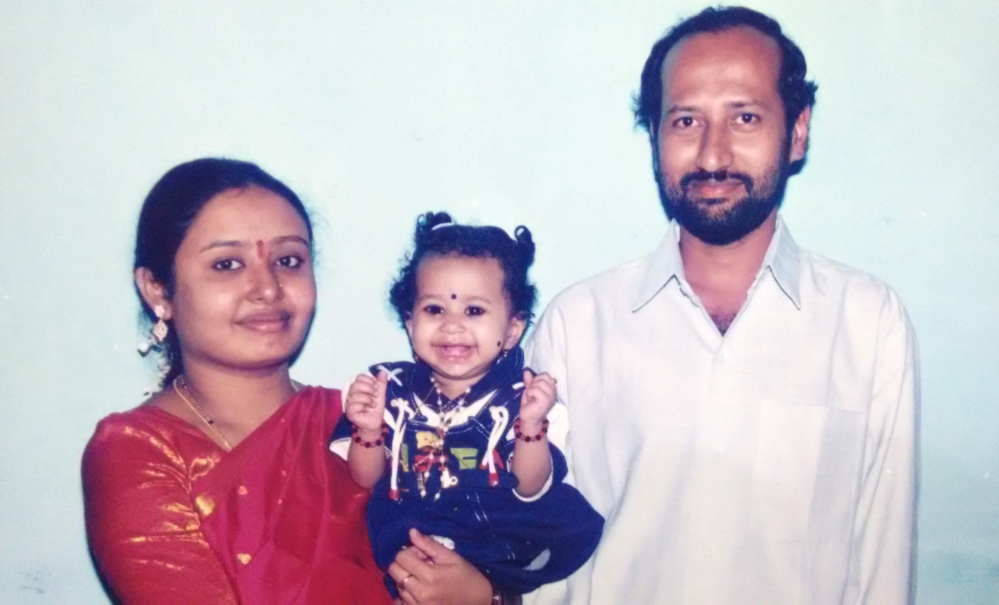

In [ ]:
## TODO: LOAD IMAGE
url = '/content/gdrive/MyDrive/IMG_20150610_211249922.jpg'
myImg = io.imread(url)  
cat_url='/content/gdrive/MyDrive/IMG_20211120_001046.jpg'
cat_image= io.imread(cat_url) 
cv2_imshow(cv.cvtColor(myImg, cv.COLOR_BGR2RGB))


##Step3: Image Contours and Histograms

In [ ]:
# Check the image matrix data type (could know the bit depth of the image)
print(myImg.dtype)
# Check the height of image 
print(myImg.shape[0])
# Check the width of image 
print(myImg.shape[1])
# Check the number of channels of the image
print(myImg.shape[2])

uint8
1836
3033
3


### Generate Histogram of color image and grayscale image
Sometimes you want to enhance the contrast in your image or expand the contrast in a particular region while sacrificing the detail in colors that don’t vary much, or don’t matter. A good tool to find interesting regions is the histogram. To create a histogram of our image data, we use the matplot.pylab `hist()` function.

More info: [Histogram](https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_histograms/py_table_of_contents_histograms/py_table_of_contents_histograms.html)

Display the histogram of all the pixels in the color image

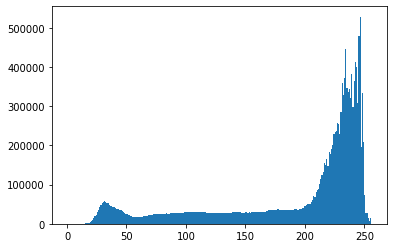

In [ ]:
plt.hist(myImg.ravel(),bins = 256, range = [0,256]) 
plt.show()

Display the histogram of R, G, B channel
We could observe that the green channel has many pixels in 255, which represents the white patch in the image

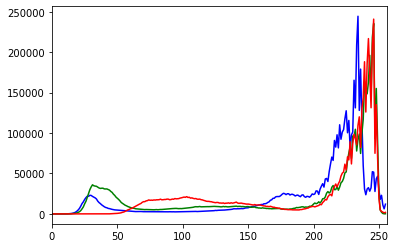

In [ ]:
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv.calcHist([myImg],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
plt.show()

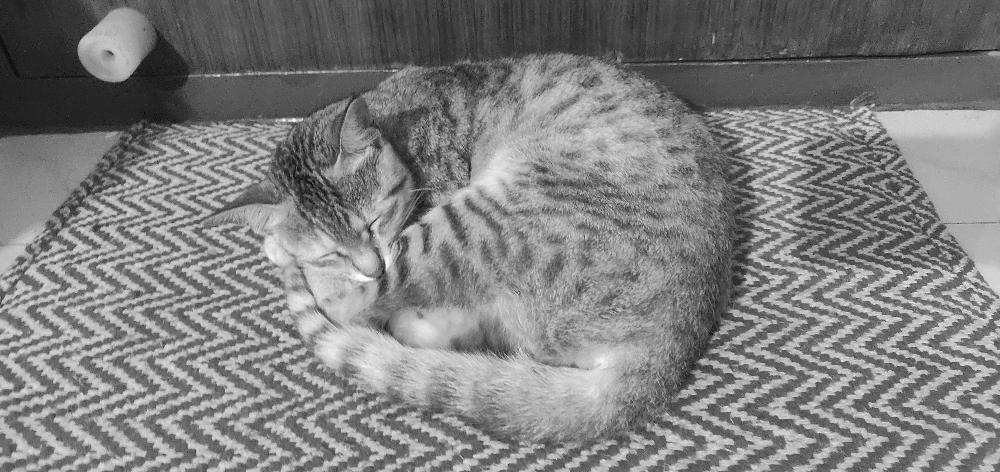

In [ ]:
gray_image_simbha = cv.cvtColor(cat_image, cv.COLOR_BGR2GRAY)
cv2_imshow(gray_image_simbha)

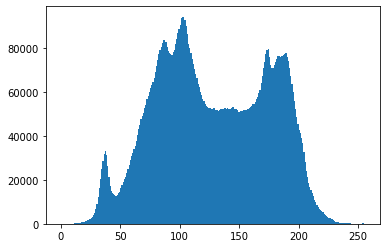

In [ ]:
# Plot the histogram of the gray image. We could observe that the frequency of
# the image hist has decreased ~ 1/3 of the histogram of color image
plt.hist(gray_image_simbha.ravel(),bins = 256, range = [0, 256])
plt.show()

 #### TODO # 2: DISPLAY THE GRAYSCALE OF YOUR COLOR IMAGE AND GENERATE HISTOGRAM


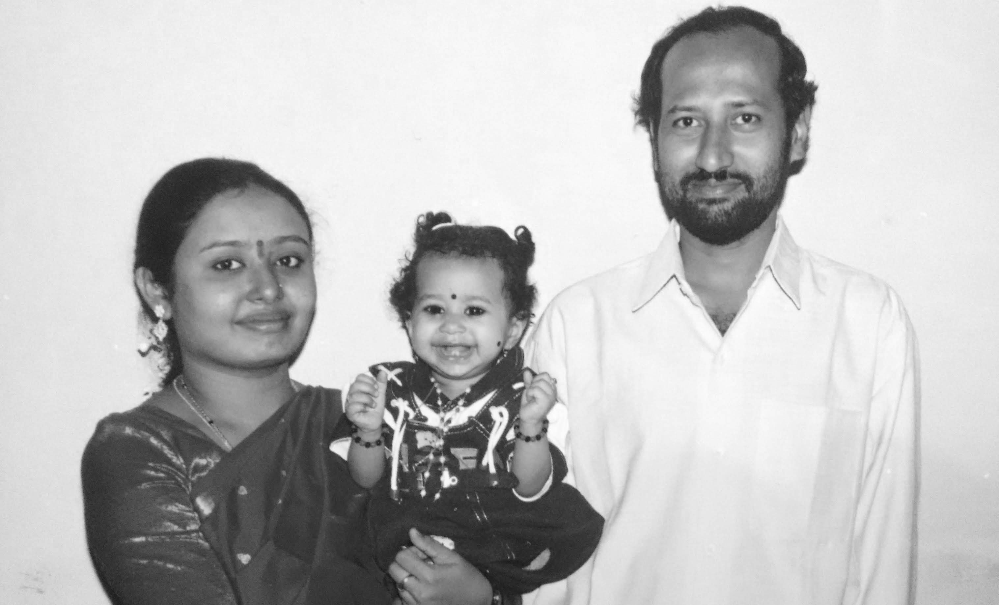

In [ ]:
myGrayImg = cv.cvtColor(myImg, cv.COLOR_BGR2GRAY)
cv2_imshow(myGrayImg)

### Find image contour of the grayscale image

Method 1: Use the matplotlib. contour

More Info: [matplotlib contour](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.contour.html)

In [ ]:
gray_image=cv.cvtColor(image, cv.COLOR_BGR2GRAY)

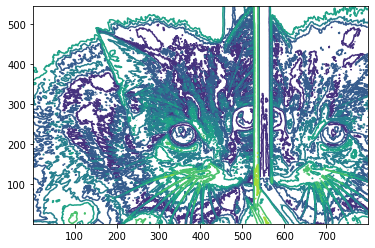

In [ ]:
g_img=gray_image
plt.contour(g_img, origin = "image")

Method 2: Use the openCV lib

More info: [Contour](https://docs.opencv.org/3.1.0/d4/d73/tutorial_py_contours_begin.html)

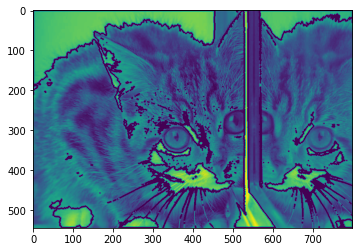

In [ ]:
# Set threshold for the countour detection
ret, thresh = cv.threshold(g_img,150,255,0)
contours, hierarchy = cv.findContours(thresh, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
cv.drawContours(g_img, contours, -1, (0, 255, 0), 3)
plt.imshow(g_img)

#### TODO # 3: Find the contour of your own image

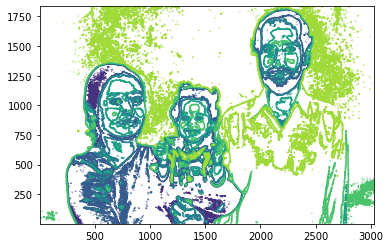

In [ ]:
# Your code
plt.contour(myGrayImg,origin = "image")

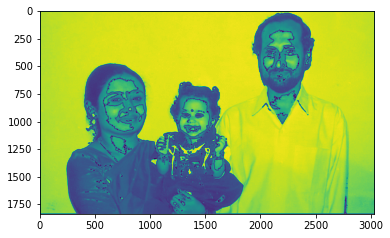

In [ ]:
ret, thresh = cv.threshold(myGrayImg,150,255,0)
contours, hierarchy = cv.findContours(thresh, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
cv.drawContours(myGrayImg, contours, -1, (0, 255, 0), 3)
plt.imshow(myGrayImg)

##Step4: Grayscale Transform and Histogram Equalization


### Grayscale Transformation
This section provides some examples of conducting mathematical transformations of the grayscale image

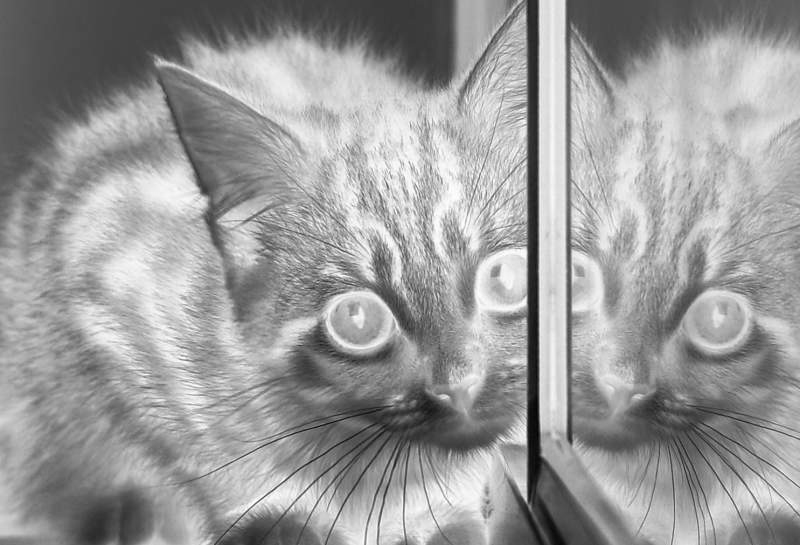

In [ ]:
# This is an inverse operation of the grayscale image, you could see that the
# bright pixels become dark, and the dark pixels become bright
im2 = 255 - gray_image
cv2_imshow(im2)

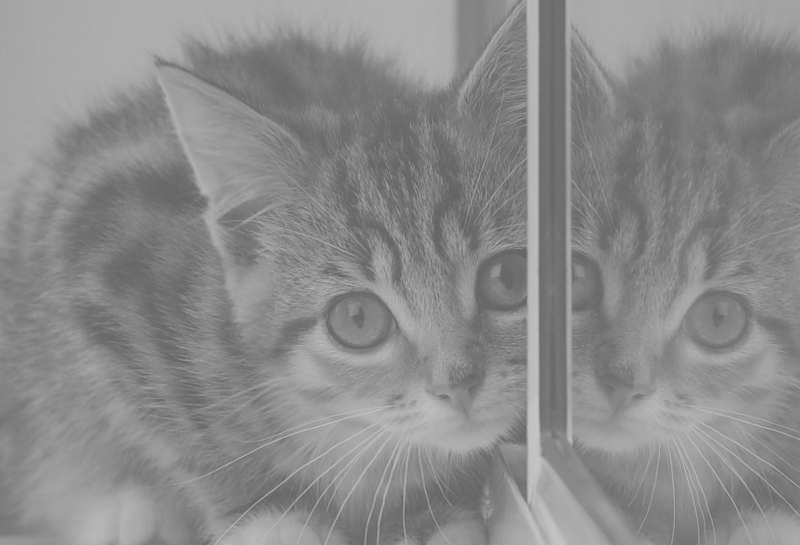

In [ ]:
# Another transform of the image, after adding a constant, 
# all the pixels become brighter and a hazing-like effect of the image is generated
im3 = (100.0/255)*gray_image + 100
cv2_imshow(im3)

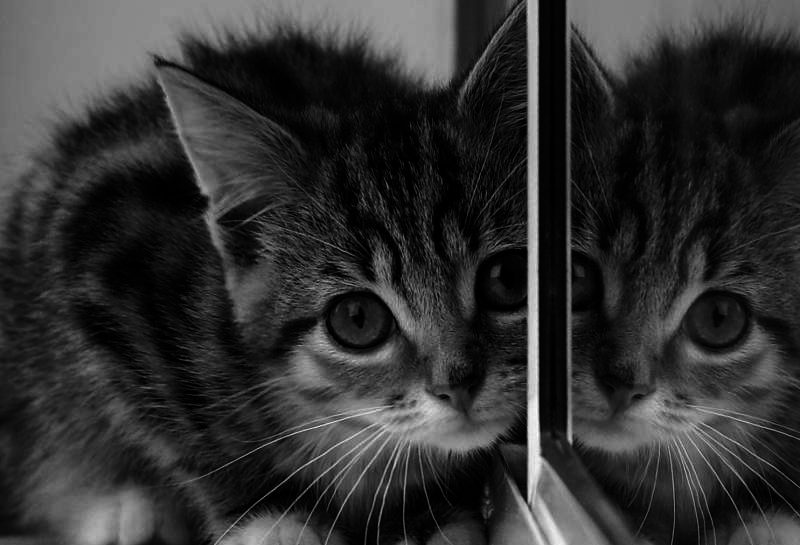

In [ ]:
# The lightness level of the gray_image decreases after this step
im4 = 255.0*(gray_image/255.0)**2
cv2_imshow(im4)

#### TODO #4:  Try some mathematical operations on your image


**Log Transformations** 

Mathematically, log transformations can be expressed as s = clog(1+r). Here, s is the output intensity, r>=0 is the input intensity of the pixel, and c is a scaling constant. Practically, log transformation maps a narrow range of low-intensity input values to a wide range of output values. [1]

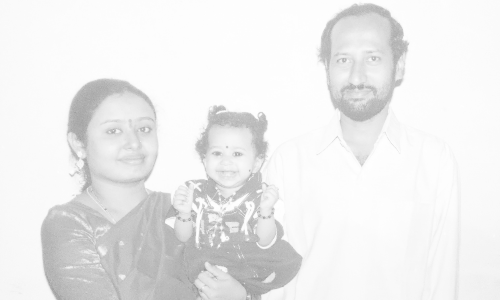

In [ ]:
## Implement your code here
myGrayImg = cv.cvtColor(myImg, cv.COLOR_BGR2GRAY)
myGrayImg=cv.resize(myGrayImg,(500,300))
c = 255/(np.log(1 + np.max(myGrayImg)))
myGrayImage_log_transformed = c * np.log(1 + myGrayImg)
myGrayImage_log_transformed=np.array(myGrayImage_log_transformed, dtype = np.uint8)
cv2_imshow(myGrayImage_log_transformed)

**Power-Law (Gamma) Transformation**

Power-law (gamma) transformations can be mathematically expressed as s = cr^{\gamma}. Gamma correction is important for displaying images on a screen correctly, to prevent bleaching or darkening of images when viewed from different types of monitors with different display settings[1]

Figure Gamma 0.5


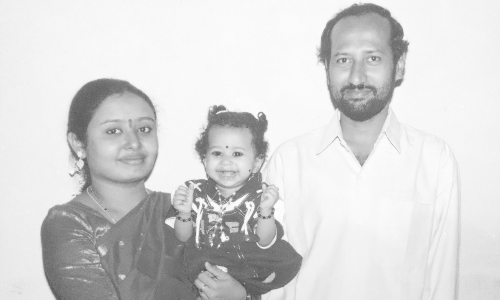

Figure Gamma 1.2


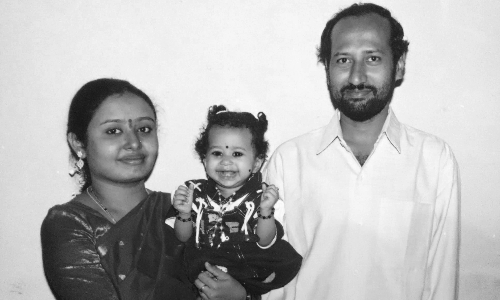

Figure Gamma 2.2


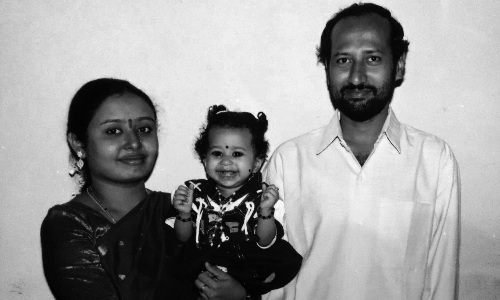

In [ ]:
for gamma in [0.5, 1.2, 2.2]:
      
    # Apply gamma correction.
    gamma_corrected = np.array(255*(myGrayImg / 255) ** gamma, dtype = 'uint8')
    print('Figure Gamma',gamma)
    cv2_imshow(gamma_corrected)

### Histogram Equalization
This section demonstrates histogram equalization on a dark image. This transform flattens the gray-level histogram so that all intensities are as equally common as possible. The transform function is a cumulative distribution function (cdf) of the pixel values in the image (normalized to map the range of pixel values to the desired range). This example uses image 4 (im4).

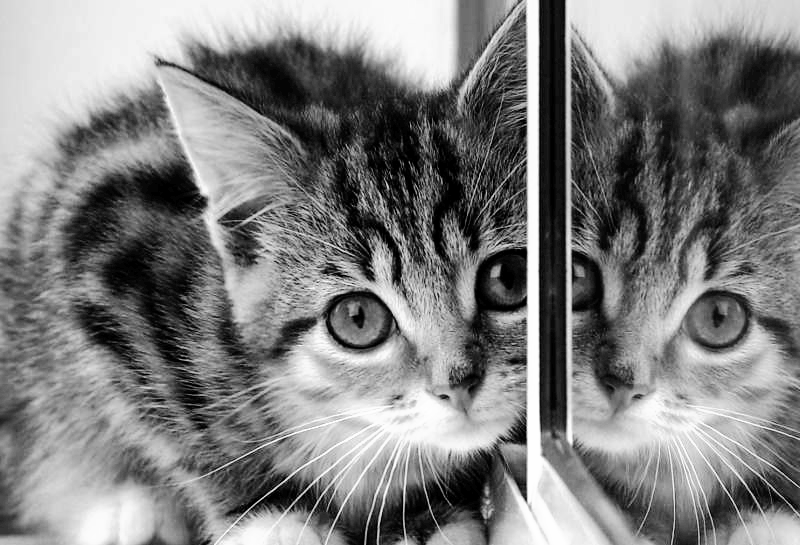

In [ ]:
# function of histogram equalization
def histeq(im, nbr_bins = 256):
  """ Histogram equalization of a grayscale image.  """
  # get the image histogram
  imhist, bins = np.histogram(im.flatten(), nbr_bins, [0, 256])
  cdf = imhist.cumsum() # cumulative distribution function
  cdf = imhist.max()*cdf/cdf.max()  #normalize
  cdf_mask = np.ma.masked_equal(cdf, 0)
  cdf_mask = (cdf_mask - cdf_mask.min())*255/(cdf_mask.max()-cdf_mask.min())
  cdf = np.ma.filled(cdf_mask,0).astype('uint8')
  return cdf[im.astype('uint8')]

# apply the function on your dark image to increase the contrast
# we could observe that the contrast of the black background has increased
im5 = histeq(im4)
cv2_imshow(im5)

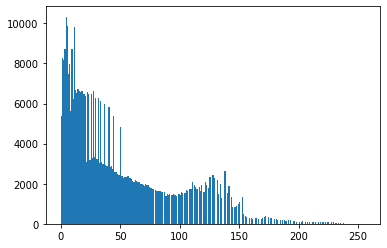

In [ ]:
# Extra: try to visualize the histogram of the image after histogram equalization
# Before histogram equalization
plt.hist(im4.ravel(),bins = 256, range = [0, 256])
plt.show()

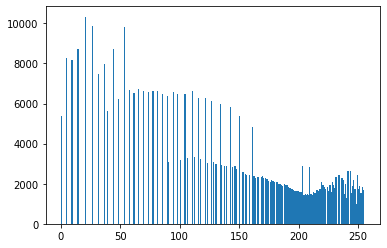

In [ ]:
# After histogram equalization
plt.hist(im5.ravel(),bins = 256, range = [0, 256])
plt.show()

#### TODO # 5: Do a histogram equalization on your grayscale image



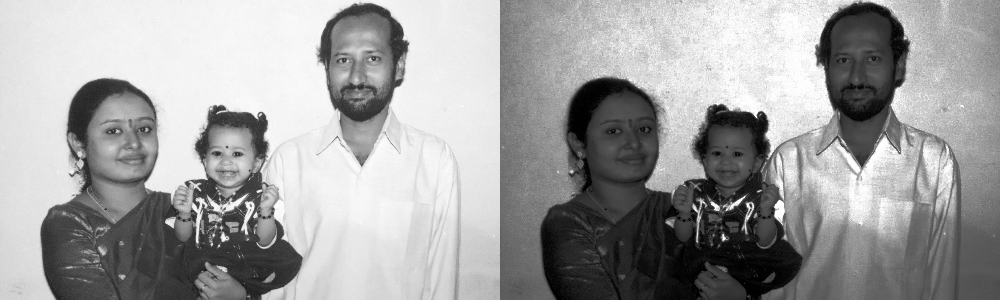

In [ ]:
## TODO: IMPLEMENT YOUR CODE HERE
## CODE INSTRUCTION
my_grayscale_after_hist=histeq(myGrayImg)
final_frame_grayscale = cv.hconcat((myGrayImg, my_grayscale_after_hist))
cv2_imshow(final_frame_grayscale)

Figure Before histogram equalization


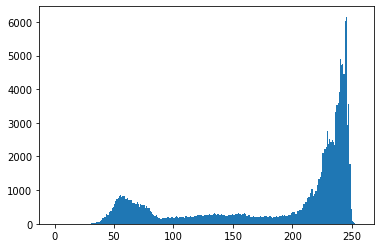

Figure After histogram equalization


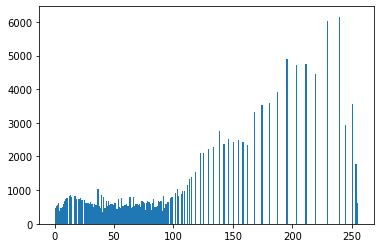

In [ ]:
print("Figure Before histogram equalization")
plt.hist(myGrayImg.ravel(),bins = 256, range = [0, 256])
plt.show()
print("Figure After histogram equalization")
plt.hist(my_grayscale_after_hist.ravel(),bins = 256, range = [0, 256])
plt.show()

##Step5: Fourier Transform of Gray Images
[FFT](https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_transforms/py_fourier_transform/py_fourier_transform.html)
> A fourier transform is used to find the frequency domian of an image. You can consider an image as a signal which is sampled in two directions. So taking a fourier transform in both X and Y directions gives you the frequency representation of image. For the sinusoidal signal, if the amplitude varies so fast in short time, you can say it is a high frequency signal. If it varies slowly, it is a low frequency signal. Edges and noises are high frequency contents in an image because they change drastically in images.

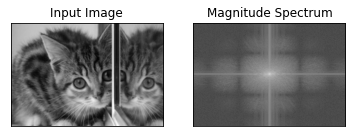

In [ ]:
# Blur the grayscale image by a Guassian filter with kernel size of 10
imBlur = cv.blur(gray_image,(5,5))
# Transform the image to frequency domain
f = np.fft.fft2(imBlur)
# Bring the zero-frequency component to the center
fshift = np.fft.fftshift(f)
magnitude_spectrum = 30*np.log(np.abs(fshift))

plt.subplot(121),plt.imshow(imBlur, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(magnitude_spectrum, cmap = 'gray')
plt.title('Magnitude Spectrum'), plt.xticks([]), plt.yticks([])
plt.show()

### TODO # 6: Generate a fourier transform of your grayscale image

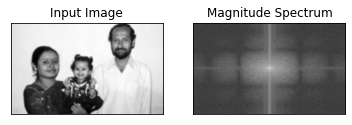

In [ ]:
# todo: Implement your code here
# Blur the grayscale image by a Guassian filter with kernel size of 10
imBlur_my_image = cv.blur(myGrayImg,(5,5))
# Transform the image to frequency domain
f_my_image = np.fft.fft2(imBlur_my_image)
# Bring the zero-frequency component to the center
fshift_my_image = np.fft.fftshift(f_my_image)
magnitude_spectrum_my_image = 30*np.log(np.abs(fshift_my_image))

plt.subplot(121),plt.imshow(imBlur_my_image, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(magnitude_spectrum_my_image, cmap = 'gray')
plt.title('Magnitude Spectrum'), plt.xticks([]), plt.yticks([])
plt.show()

## Step6: Finding Edges by Highpass Filtering in FFT

This section demonstrates conducting a high pass filter to remove the low frequency component, resulting in a sharpened image which contains the edges

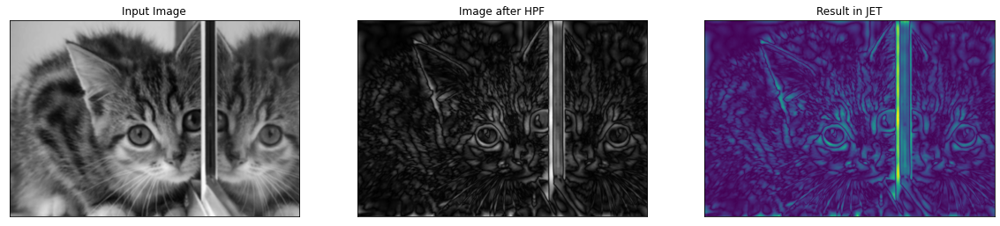

In [ ]:
rows, cols = imBlur.shape
crow,ccol = round(rows/2) , round(cols/2)
# remove low frequencies with a rectangle size of 10
fshift[crow-10:crow+10, ccol-10:ccol+10] = 0
f_ishift = np.fft.ifftshift(fshift)
img_back = np.fft.ifft2(f_ishift)
img_back = np.abs(img_back)

plt.figure(figsize=([20, 20]))
plt.subplot(131),plt.imshow(imBlur, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(132),plt.imshow(img_back, cmap = 'gray')
plt.title('Image after HPF'), plt.xticks([]), plt.yticks([])
plt.subplot(133),plt.imshow(img_back)
plt.title('Result in JET'), plt.xticks([]), plt.yticks([])
plt.show()

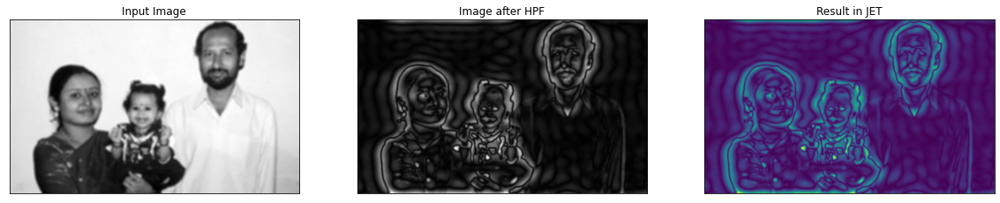

In [ ]:
rows, cols = imBlur_my_image.shape
crow,ccol = round(rows/2) , round(cols/2)
# remove low frequencies with a rectangle size of 10
fshift_my_image[crow-10:crow+10, ccol-10:ccol+10] = 0
f_ishift_my_image = np.fft.ifftshift(fshift_my_image)
img_back_my_image = np.fft.ifft2(f_ishift_my_image)
img_back_my_image = np.abs(img_back_my_image)

plt.figure(figsize=([20, 20]))
plt.subplot(131),plt.imshow(imBlur_my_image, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(132),plt.imshow(img_back_my_image, cmap = 'gray')
plt.title('Image after HPF'), plt.xticks([]), plt.yticks([])
plt.subplot(133),plt.imshow(img_back_my_image)
plt.title('Result in JET'), plt.xticks([]), plt.yticks([])
plt.show()

**Answer 4 Results Analysis**


*  Python provides various tools for processing and editing images which can be used for various applications like historical image restoration or betterment of the quality of images. 
*  As we increase the value of gamma, we can see the images get darker, we can use this to preserve image quality on different screen settings
*   Histogram Equalization is used to improve contrast in images by changing intensity distribution
*   Image contouring can help in shape analysis and object detection and recognition. HPF and JET can also be used for these purposes





# MNIST Classification Using *Convolutional Neural Network*
---
- Author: Vladimir Shapiro, adopted from Diego Inácio's
- Notebook: [MNIST_classification.ipynb](https://github.com/diegoinacio/computer-vision-notebooks/blob/master/Computer-Vision-Experiments/MNIST_classification.ipynb)
---
Digit classification using *Convolutional Neural Network*.

# **Part 2**
**Classification of handwritten digits is a typical use case for AI in vision. With the recent advancement of Deep Learning, unparalleled levels of accuracy,often exceeding human’s, have been achieved. This assignment involves an experiment with one such Deep Learning model implemented using the Keras framework**

**Answer 1 and 2 Load and run the scripts**

In [ ]:
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

import tensorflow as tf

## Read the dataset
---

In [ ]:
mnist = tf.keras.datasets.mnist
[X_train, Y_train],[X_test, Y_test] = mnist.load_data()
X_train = X_train[..., None]
X_test = X_test[..., None]

# one hot for multi-class classification
# MNIST = 10 classes [0-9]
Y_train_oh = np.zeros((Y_train.size, 10))
Y_train_oh[np.arange(Y_train.size), Y_train] = 1
Y_test_oh = np.zeros((Y_test.size, 10))
Y_test_oh[np.arange(Y_test.size), Y_test] = 1

print('X_train:', X_train.shape)
print('Y_train:', Y_train.shape)
print('Y_train_oh:', Y_train_oh.shape)
print('X_test:', X_test.shape)
print('Y_test:', Y_test.shape)
print('Y_test_oh:', Y_test_oh.shape)

11501568/11490434 [==============================] - 0s 0us/step
X_train: (60000, 28, 28, 1)
Y_train: (60000,)
Y_train_oh: (60000, 10)
X_test: (10000, 28, 28, 1)
Y_test: (10000,)
Y_test_oh: (10000, 10)


Display several randomly selected handwritten digits to provide a raw impression how the digits look like.

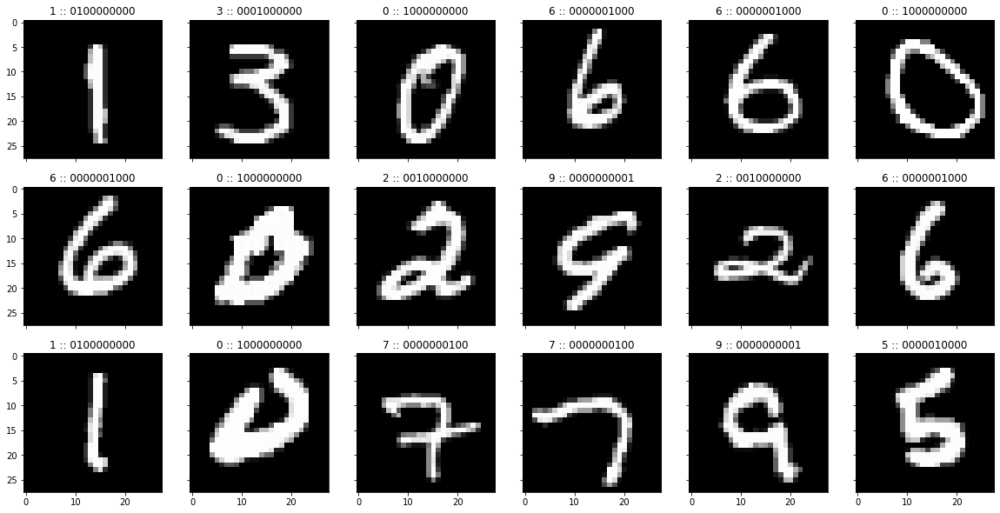

In [ ]:
plt.rcParams['figure.figsize'] = (20, 10)
fig, AX = plt.subplots(3, 6, sharex=True, sharey=True)

np.random.seed(1234)
for ax in AX.ravel():
    rindex = np.random.randint(Y_train.size)
    img_show = X_train[rindex][...,0]
    ax.imshow(img_show, cmap='gray')
    # title label + one-hot
    title = f'{Y_train[rindex]} :: '
    title += ''.join([str(int(e)) for e in Y_train_oh[rindex]]) 
    ax.set_title(title)
plt.grid(False)

## Transform dataset
---

To a format suitable for the training and predictions later on. A separate *X_test* dataset is allocated.

In [ ]:
# Change dtype to float32
X_train = X_train.astype(np.float32)
Y_train = Y_train.astype(np.float32)
X_test = X_test.astype(np.float32)
Y_test = Y_test.astype(np.float32)

# Change axes and normalization
X_train, Y_train = X_train/255, Y_train.reshape(-1, 1)
X_test, Y_test = X_test/255, Y_test.reshape(-1, 1)

# reshape Xs
x_train = X_train.reshape(-1, 28*28)
x_test = X_test.reshape(-1, 28*28)

print('X_train:', X_train.shape)
print('x_train:', x_train.shape)
print('Y_train:', Y_train.shape)
print('Y_train_oh:', Y_train_oh.shape)
print('X_test:', X_test.shape)
print('x_test:', x_test.shape)
print('Y_test:', Y_test.shape)
print('Y_test_oh:', Y_test_oh.shape)

X_train: (60000, 28, 28, 1)
x_train: (60000, 784)
Y_train: (60000, 1)
Y_train_oh: (60000, 10)
X_test: (10000, 28, 28, 1)
x_test: (10000, 784)
Y_test: (10000, 1)
Y_test_oh: (10000, 10)


# Classification using *Convolutional Neural Network (CNN)*
---

CNN is mostly used for computer vision tasks. It has multiple inner hidden layers, an input layer and output layer. They are good at identifying features that are important for making distrinctions between images. The first layer of a convolutional network is the convolutional layer. While further convolutional layers or pooling layers can be added after convolutional layers, the fully-connected layer is the last layer. The CNN becomes more complicated with each layer, detecting larger areas of the image. Earlier layers concentrate on basic elements like colors and borders. As the visual data passes through the CNN's layers, it begins to recognize larger elements or shapes of the object, eventually identifying the desired object. [2]

The image below shows an example of CNN

**Figure 1**
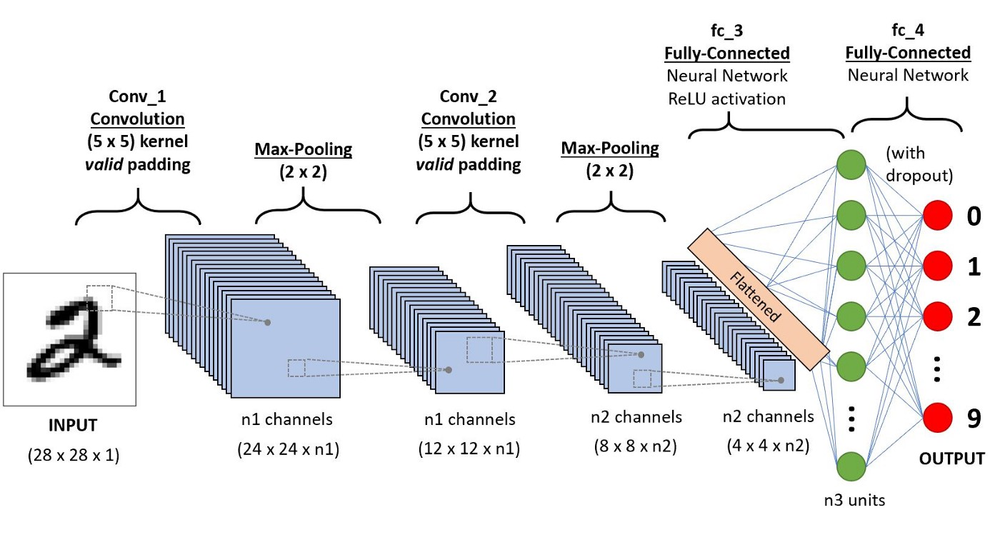

## Training

Create Keras' Sequential CNN model, which is appropriate for a plain stack of layers where each layer has exactly one input tensor and one output tensor.

First, define the *structure* or *architecture* of the CNN model:

In [ ]:
# Get dimensions
N1, N2, C = X_train[0].shape

# Model
modelCNN = tf.keras.Sequential([
    tf.keras.layers.Input(X_train[0].shape),
    tf.keras.layers.Conv2D(32, 3, activation='relu'),
    tf.keras.layers.Conv2D(64, 3, activation='relu'),
    tf.keras.layers.MaxPooling2D(pool_size=2),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(N1*N2, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(10, activation='softmax')
])

modelCNN.summary() # Display the structure

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 26, 26, 32)        320       
                                                                 
 conv2d_1 (Conv2D)           (None, 24, 24, 64)        18496     
                                                                 
 max_pooling2d (MaxPooling2D  (None, 12, 12, 64)       0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 12, 12, 64)        0         
                                                                 
 flatten (Flatten)           (None, 9216)              0         
                                                                 
 dense (Dense)               (None, 784)               7226128   
                                                        

Now, *build* the actual model, that is allocate computer memory, connections, hyperparameters, etc. per definitions above.

In [ ]:
modelCNN.compile(
    loss='categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)


Begin the CNN training for a given number of epochs. 
    
    Tip: Training on a conventional CPU is significantly slower than on GPU/TPU. To request that go to "Runtime" -> "Change Runtime Type" and select "GPU" from the dropdown list prior to running the script.

In [ ]:
NUMBER_OF_EPOCHS = 10
model_cnn=modelCNN.fit(X_train, Y_train_oh, epochs=NUMBER_OF_EPOCHS)

Epoch 1/10
1875/1875 [==============================] - 32s 11ms/step - loss: 0.1251 - accuracy: 0.9608
Epoch 2/10
1875/1875 [==============================] - 21s 11ms/step - loss: 0.0508 - accuracy: 0.9841
Epoch 3/10
1875/1875 [==============================] - 21s 11ms/step - loss: 0.0375 - accuracy: 0.9883
Epoch 4/10
1875/1875 [==============================] - 21s 11ms/step - loss: 0.0278 - accuracy: 0.9912
Epoch 5/10
1875/1875 [==============================] - 21s 11ms/step - loss: 0.0230 - accuracy: 0.9927
Epoch 6/10
1875/1875 [==============================] - 21s 11ms/step - loss: 0.0180 - accuracy: 0.9942
Epoch 7/10
1875/1875 [==============================] - 21s 11ms/step - loss: 0.0167 - accuracy: 0.9948
Epoch 8/10
1875/1875 [==============================] - 21s 11ms/step - loss: 0.0139 - accuracy: 0.9955
Epoch 9/10
1875/1875 [==============================] - 21s 11ms/step - loss: 0.0131 - accuracy: 0.9959
Epoch 10/10
1875/1875 [==============================] - 21s 11m

## Testing

Now, we have the trained model and can do predictions.

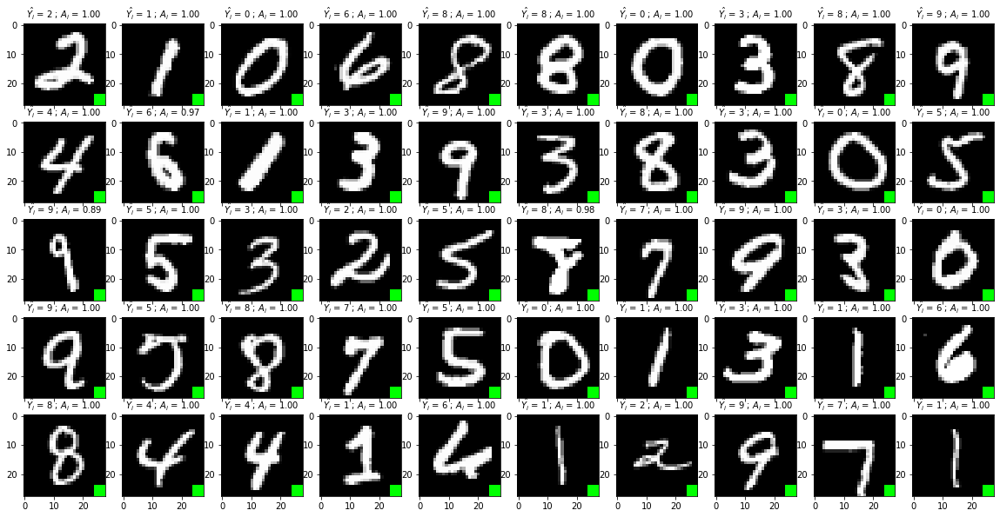

In [ ]:
fig, AX = plt.subplots(5, 10, sharex=True)
AX = [b for a in AX for b in a]

prediction_on_test = modelCNN.predict(X_test)

np.random.seed(1234)
for ax in AX:
    index = np.random.randint(Y_test.size)
    # Predict
    A_ = prediction_on_test[index]
    Y_ = np.argmax(A_)
    # Prepare image to show
    img_show = np.ones((N1, N2, 3))
    img_show *= X_test[index]
    # Green square: classified correctly
    # Red square: classified wrongly
    if Y_ == Y_test[index]:
        img_show[-4:, -4:] = (0, 1, 0)
    else:
        img_show[-4:, -4:] = (1, 0, 0)
    ax.imshow(img_show)
    ax.set_title(r'$\hat{Y_i}$ = ' + str(Y_) + r' ; $A_i$ = {:.02f}'.format(float(A_[Y_])), fontsize=10)

Calculate a validation metric as:

In [ ]:
print('Validation')
prediction_on_test = modelCNN.predict(X_test)
print('Test:', np.sum((Y_test_oh - prediction_on_test)**2, axis=1).mean())

prediction_on_train = modelCNN.predict(X_train)
print('Train:', np.sum((Y_train_oh - prediction_on_train)**2, axis=1).mean())

Validation
Test: 0.013534906844324127
Train: 0.0013769770457876251


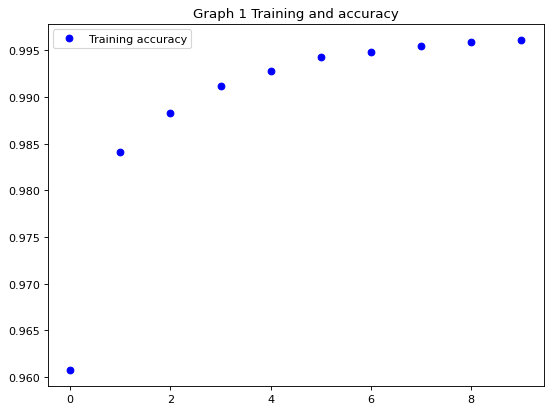

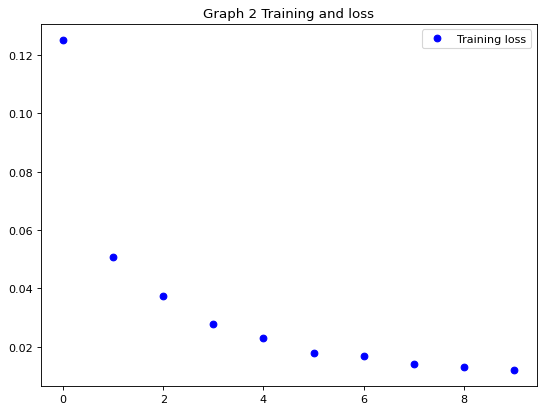

In [ ]:
accuracy = model_cnn.history['accuracy']
##val_accuracy = model_cnn.history['val_acc']
loss = model_cnn.history['loss']
##val_loss = model_cnn.history['val_loss']
epochs = range(len(accuracy))
plt.figure(figsize=(8, 6), dpi=80)
plt.plot(epochs, accuracy, 'bo', label='Training accuracy')
##plt.plot(epochs, val_accuracy, 'b', label='Validation accuracy')
plt.title('Graph 1 Training and accuracy')
plt.legend()
plt.figure(figsize=(8, 6), dpi=80)
plt.plot(epochs, loss, 'bo', label='Training loss')
##plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Graph 2 Training and loss')
plt.legend()
plt.show()


In [ ]:
# Get dimensions
N1, N2, C = X_train[0].shape

# Model
modelCNN1 = tf.keras.Sequential([
    tf.keras.layers.Input(X_train[0].shape),
    tf.keras.layers.Conv2D(32, 3, activation='relu'),
    tf.keras.layers.Conv2D(64, 3, activation='relu'),
    tf.keras.layers.MaxPooling2D(pool_size=2),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(N1*N2, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(10, activation='softmax')
])

modelCNN1.summary() # Display the structure

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 26, 26, 32)        320       
                                                                 
 conv2d_3 (Conv2D)           (None, 24, 24, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 12, 12, 64)       0         
 2D)                                                             
                                                                 
 dropout_2 (Dropout)         (None, 12, 12, 64)        0         
                                                                 
 flatten_1 (Flatten)         (None, 9216)              0         
                                                                 
 dense_2 (Dense)             (None, 784)               7226128   
                                                      

In [ ]:
modelCNN1.compile(
    loss='categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy'])

In [ ]:
NUMBER_OF_EPOCHS = 15
model_cnn=modelCNN.fit(X_train, Y_train_oh, epochs=NUMBER_OF_EPOCHS)

Epoch 1/15
1875/1875 [==============================] - 26s 14ms/step - loss: 0.0082 - accuracy: 0.9980
Epoch 2/15
1875/1875 [==============================] - 26s 14ms/step - loss: 0.0077 - accuracy: 0.9978
Epoch 3/15
1875/1875 [==============================] - 26s 14ms/step - loss: 0.0074 - accuracy: 0.9980
Epoch 4/15
1875/1875 [==============================] - 26s 14ms/step - loss: 0.0053 - accuracy: 0.9984
Epoch 5/15
1875/1875 [==============================] - 26s 14ms/step - loss: 0.0075 - accuracy: 0.9982
Epoch 6/15
1875/1875 [==============================] - 26s 14ms/step - loss: 0.0069 - accuracy: 0.9981
Epoch 7/15
1875/1875 [==============================] - 26s 14ms/step - loss: 0.0074 - accuracy: 0.9981
Epoch 8/15
1875/1875 [==============================] - 26s 14ms/step - loss: 0.0062 - accuracy: 0.9983
Epoch 9/15
1875/1875 [==============================] - 26s 14ms/step - loss: 0.0070 - accuracy: 0.9982
Epoch 10/15
1875/1875 [==============================] - 26s 14m

In [ ]:
print('Validation')
prediction_on_test = modelCNN.predict(X_test)
print('Test:', np.sum((Y_test_oh - prediction_on_test)**2, axis=1).mean())

prediction_on_train = modelCNN.predict(X_train)
print('Train:', np.sum((Y_train_oh - prediction_on_train)**2, axis=1).mean())

Validation
Test: 0.01786857805513775
Train: 0.00016601262494027737


**Answer 3 After making predictions and calculating validation metrics change the number of training epochs, get new validation results, and reflect on them with the original number of epochs.**

We can observe that when we used 10 epochs, we got excellent result. We can also observe from graph 1 and 2 that we have highest accuracy and least loss when the epochs are 10. When increased to 15, there is not much change in the results but the computation time required is increased tremendously. So, this tradeoff may not be worth it. We can conclude that 10 is the optimal number of epochs for this task 

**Answer 4 Explore alternatives to the default model parameters such as loss, optimizer, and metrics. Experiment with the alternatives, report results, and interpret them including the motivation behind parameter selection**


In [ ]:
modelCNN.compile(
    loss='kullback_leibler_divergence',
    optimizer='adam',
    metrics=['cosine_proximity']
)

1. **Loss**
For multi class classification, we may use Multi-Class Cross-Entropy Loss,Sparse Multiclass Cross-Entropy Loss or Kullback Leibler Divergence Loss. KL-divergence is a measure on probability distributions. It essentially captures the information loss between ground truth distribution and predicted.L2-norm/MSE/RMSE doesn’t do well with probabilities, because of the power operations involved in the calculation of loss. Measure of information loss is a very important measure for images. [3]

2. **Optimizer**
Adam is the best optimizer to use for imagine classification because of its dynamic learning rate. It trains the model efficiently and in less time. [3]

3. **Metrics**
'cosine_proximity' Computes the cosine similarity between the labels and predictions. These measures can help us detect the place of improvements.

In [ ]:
NUMBER_OF_EPOCHS = 10
model_cnn_param=modelCNN.fit(X_train, Y_train_oh, epochs=NUMBER_OF_EPOCHS)

Epoch 1/10
1875/1875 [==============================] - 22s 11ms/step - loss: 0.0119 - cosine_proximity: 0.9970
Epoch 2/10
1875/1875 [==============================] - 20s 11ms/step - loss: 0.0092 - cosine_proximity: 0.9975
Epoch 3/10
1875/1875 [==============================] - 20s 11ms/step - loss: 0.0096 - cosine_proximity: 0.9974
Epoch 4/10
1875/1875 [==============================] - 20s 11ms/step - loss: 0.0098 - cosine_proximity: 0.9975
Epoch 5/10
1875/1875 [==============================] - 20s 11ms/step - loss: 0.0088 - cosine_proximity: 0.9977
Epoch 6/10
1875/1875 [==============================] - 20s 11ms/step - loss: 0.0073 - cosine_proximity: 0.9980
Epoch 7/10
1875/1875 [==============================] - 22s 12ms/step - loss: 0.0085 - cosine_proximity: 0.9977
Epoch 8/10
1875/1875 [==============================] - 21s 11ms/step - loss: 0.0074 - cosine_proximity: 0.9980
Epoch 9/10
1875/1875 [==============================] - 21s 11ms/step - loss: 0.0081 - cosine_proximity:

In [ ]:
modelCNN.compile(
    loss='categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy'],
    loss_weights = None, 
   sample_weight_mode = None, 
   weighted_metrics = None, 
   target_tensors = None
)

In [ ]:
NUMBER_OF_EPOCHS = 10
model_cnn_param=modelCNN.fit(X_train, Y_train_oh, epochs=NUMBER_OF_EPOCHS)

Epoch 1/10
1875/1875 [==============================] - 20s 11ms/step - loss: 0.0090 - accuracy: 0.9976
Epoch 2/10
1875/1875 [==============================] - 21s 11ms/step - loss: 0.0077 - accuracy: 0.9979
Epoch 3/10
1875/1875 [==============================] - 20s 11ms/step - loss: 0.0077 - accuracy: 0.9980
Epoch 4/10
1875/1875 [==============================] - 20s 11ms/step - loss: 0.0067 - accuracy: 0.9982
Epoch 5/10
1875/1875 [==============================] - 20s 11ms/step - loss: 0.0060 - accuracy: 0.9984
Epoch 6/10
1875/1875 [==============================] - 20s 11ms/step - loss: 0.0063 - accuracy: 0.9983
Epoch 7/10
1875/1875 [==============================] - 20s 11ms/step - loss: 0.0065 - accuracy: 0.9984
Epoch 8/10
1875/1875 [==============================] - 20s 11ms/step - loss: 0.0085 - accuracy: 0.9982
Epoch 9/10
1875/1875 [==============================] - 20s 11ms/step - loss: 0.0044 - accuracy: 0.9987
Epoch 10/10
1875/1875 [==============================] - 20s 11m

**Answer 5 Bonus task: experiment with the hyperparameters of the model, and/or the architecture of the CNN, and report the results of the experiments.**

In [ ]:
!pip install keras-tuner --upgrade
import kerastuner as kt

     |████████████████████████████████| 133 kB 5.3 MB/s 


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: `import kerastuner` is deprecated, please use `import keras_tuner`.
  


In [ ]:
from tensorflow import keras
def model_builder(hp):
  '''
  Args:
    hp - Keras tuner object
  '''
  # Initialize the Sequential API and start stacking the layers
  model = keras.Sequential()
  model.add(keras.layers.Flatten(input_shape=(28, 28)))
  # Tune the number of units in the first Dense layer
  # Choose an optimal value between 32-512
  hp_units = hp.Int('units', min_value=32, max_value=512, step=32)
  model.add(keras.layers.Dense(units=hp_units, activation='relu', name='dense_1'))
  # Add next layers
  model.add(keras.layers.Dropout(0.2))
  model.add(keras.layers.Dense(10, activation='softmax'))
  # Tune the learning rate for the optimizer
  # Choose an optimal value from 0.01, 0.001, or 0.0001
  hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])
  model.compile(optimizer=keras.optimizers.Adam(learning_rate=hp_learning_rate),
                loss=keras.losses.SparseCategoricalCrossentropy(),
                metrics=['accuracy'])
  return model

In [ ]:
# Instantiate the tuner
tuner = kt.Hyperband(model_builder, # the hypermodel
                     objective='val_accuracy', # objective to optimize
max_epochs=10,
factor=3, # factor which you have seen above 
directory='dir', # directory to save logs 
project_name='khyperband')

In [ ]:
# hypertuning settings
tuner.search_space_summary()

Search space summary
Default search space size: 2
units (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_value': 512, 'step': 32, 'sampling': None}
learning_rate (Choice)
{'default': 0.01, 'conditions': [], 'values': [0.01, 0.001, 0.0001], 'ordered': True}


**Conclusion**


*   Keras is very easy and simple.
*   Low-level computations are not supported by Keras. As a result, it encourages the employment of backends. TensorFlow, Theano, and Microsoft CNTK are used to power it.
*   Keras provides numerous pre-trained models and gives accurate results[4]






**References**

1. "*Python | Intensity Transformation Operations on Images*"(August 2019)  itemretrieved from https://www.geeksforgeeks.org/
2. IBM cloud education(October 20,2020) *"Convolutional Neural Networks"* retrieved from https://www.ibm.com/
3. Jason Brownlee(August 9,2017) *"How to Use Metrics for Deep Learning with Keras in Python"* retrieved from https://machinelearningmastery.com/
4. *Advantages and Drawbacks of Keras* retrieved from https://techvidvan.com/